# **Predicción del Movimiento de Nubes para la Optimización de Plantas Fotovoltaicas en Colombia**

## 1) Descarga de imágenes

A continuación se muestra el código empleado para la descarga de imágenes correspondientes a la banda 13 para el periodo de tiempo comprendido entre el 01/01/2024 y el 31/12/2024. Ingresar al siguiente repositorio de github: https://github.com/alwos19/monografia_esp_cd

## 2) Obtención del dataset

A partir de las imágenes obtenidas, se construyó un conjunto de datos (dataset) con las siguientes columnas: fecha, mes, hora, nombre del archivo, media, varianza, desviación estándar, mínimo, máximo y mediana. Las variables estadísticas fueron calculadas a partir de los valores de radiancia presentes en cada imagen, con el propósito de realizar un análisis exploratorio de los datos.

Asimismo, se incorporó una columna denominada archivo, que almacena los nombres de los archivos correspondientes a las imágenes descargadas. Esta decisión se tomó para evitar la generación de una matriz individual por cada imagen, ya que el tamaño de cada una (920x920 píxeles) representa una carga considerable en términos de recursos computacionales, lo cual podría comprometer el rendimiento del sistema o incluso provocar su bloqueo.

| Fecha               | Mes | Hora  | Hora Num | Archivo                          | Media     | Varianza   | Desviación Estándar | Mínimo   | Máximo    | Mediana   |
|---------------------|-----|-------|----------|----------------------------------|-----------|------------|----------------------|----------|-----------|-----------|
| 2024-01-01 00:00:00 | 1   | 00:00 | 0        | RadFC_20240101000020_Rad13.npy  | 75.832336 | 614.352234 | 24.786129            | 7.227110 | 104.218140| 86.155220 |
| 2024-01-01 01:00:00 | 1   | 01:00 | 1        | RadFC_20240101010020_Rad13.npy  | 75.948067 | 559.567871 | 23.655188            | 8.690435 | 103.303566| 85.149185 |
| 2024-01-01 02:00:00 | 1   | 02:00 | 2        | RadFC_20240101020020_Rad13.npy  | 75.844902 | 507.472351 | 22.527147            | 8.324604 | 102.754814| 83.731590 |
| 2024-01-01 03:00:00 | 1   | 03:00 | 3        | RadFC_20240101030020_Rad13.npy  | 75.947083 | 460.890533 | 21.468361            | 7.318568 | 103.852310| 82.954193 |
| 2024-01-01 04:00:00 | 1   | 04:00 | 4        | RadFC_20240101040020_Rad13.npy  | 76.251312 | 412.671051 | 20.314306            | 9.284912 | 102.663361| 82.451180 |


In [260]:
# Librerias de utilidad
import os
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt

In [281]:
import os
import numpy as np
import pandas as pd
from datetime import datetime
from concurrent.futures import ProcessPoolExecutor

# Ruta donde están almacenados los archivos .npy
ruta_archivos = "./rad13"
archivos = os.listdir(ruta_archivos)

# Función para procesar un archivo individual (sin guardar la matriz radiancia)
def procesar_archivo(archivo):
    if archivo.endswith(".npy") and archivo.startswith("RadFC_"):
        try:
            nombre = archivo.replace("RadFC_", "").replace("_Rad13.npy", "")
            fecha_str = nombre[:12]  # 'YYYYMMDDHHMM'
            fecha_datetime = datetime.strptime(fecha_str, "%Y%m%d%H%M")
            fecha = fecha_datetime
            mes = fecha_datetime.month
            hora = fecha_datetime.strftime("%H:%M")
            hora_num = fecha_datetime.hour
            ruta_completa = os.path.join(ruta_archivos, archivo)
            radiancia = np.load(ruta_completa).astype(np.float32)
            if radiancia.shape == (920, 920):
                return {
                    "fecha": fecha,
                    "mes": mes,
                    "hora": hora,
                    "hora_num": hora_num,
                    "archivo": archivo,
                    "media": np.mean(radiancia),
                    "varianza": np.var(radiancia),
                    "desviacion_estandar": np.std(radiancia),
                    "minimo": np.min(radiancia),
                    "maximo": np.max(radiancia),
                    "mediana": np.median(radiancia),
                }
            else:
                print(f"Dimensiones incorrectas en: {archivo}")
        except Exception as e:
            print(f"Error procesando {archivo}: {e}")
    return None

# Procesar archivos en paralelo
def procesar_archivos_en_paralelo(archivos, num_workers=os.cpu_count()):
    datos = []
    with ProcessPoolExecutor(max_workers=num_workers) as executor:
        resultados = executor.map(procesar_archivo, archivos)
        for resultado in resultados:
            if resultado is not None:
                datos.append(resultado)
    return datos

# Ejecutar el procesamiento en paralelo
datos = procesar_archivos_en_paralelo(archivos)

# Crear el DataFrame y establecer 'fecha' como índice
df_imagenes = pd.DataFrame(datos)

# Convertir la columna 'fecha' a tipo datetime y establecerla como índice
df_imagenes["fecha"] = pd.to_datetime(df_imagenes["fecha"])
df_imagenes = df_imagenes.set_index("fecha")

# Ordenar el DataFrame por índice (fecha)
df_imagenes.sort_index(inplace=True)

# Imprimir las primeras filas
print(df_imagenes.head())

                     mes   hora  hora_num                         archivo  \
fecha                                                                       
2024-01-01 00:00:00    1  00:00         0  RadFC_20240101000020_Rad13.npy   
2024-01-01 01:00:00    1  01:00         1  RadFC_20240101010020_Rad13.npy   
2024-01-01 02:00:00    1  02:00         2  RadFC_20240101020020_Rad13.npy   
2024-01-01 03:00:00    1  03:00         3  RadFC_20240101030020_Rad13.npy   
2024-01-01 04:00:00    1  04:00         4  RadFC_20240101040020_Rad13.npy   

                         media    varianza  desviacion_estandar    minimo  \
fecha                                                                       
2024-01-01 00:00:00  75.832336  614.352234            24.786129  7.227110   
2024-01-01 01:00:00  75.948067  559.567871            23.655188  8.690435   
2024-01-01 02:00:00  75.844902  507.472351            22.527147  8.324604   
2024-01-01 03:00:00  75.947083  460.890533            21.468361  7.318568  

In [282]:
df_imagenes.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8724 entries, 2024-01-01 00:00:00 to 2024-12-31 23:00:00
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mes                  8724 non-null   int64  
 1   hora                 8724 non-null   object 
 2   hora_num             8724 non-null   int64  
 3   archivo              8724 non-null   object 
 4   media                8724 non-null   float32
 5   varianza             8724 non-null   float32
 6   desviacion_estandar  8724 non-null   float32
 7   minimo               8724 non-null   float32
 8   maximo               8724 non-null   float32
 9   mediana              8724 non-null   float32
dtypes: float32(6), int64(2), object(2)
memory usage: 545.2+ KB


## 3) Análisis Exploratorio 

En esta sección se realiza la visualización de algunas de las imágenes, así como el análisis gráfico de la radiancia mínima, máxima y promedio a lo largo de los meses del año como en las diferentes horas del día.
Además, se generó un mapa de calor del promedio de radiancia por hora y por mes, con el objetivo de identificar posibles valores atípicos.
Finalmente, se analizó la distribución temporal de la radiancia en términos de sus valores promedio, máximos y mínimos.

* Visualización de imágenes

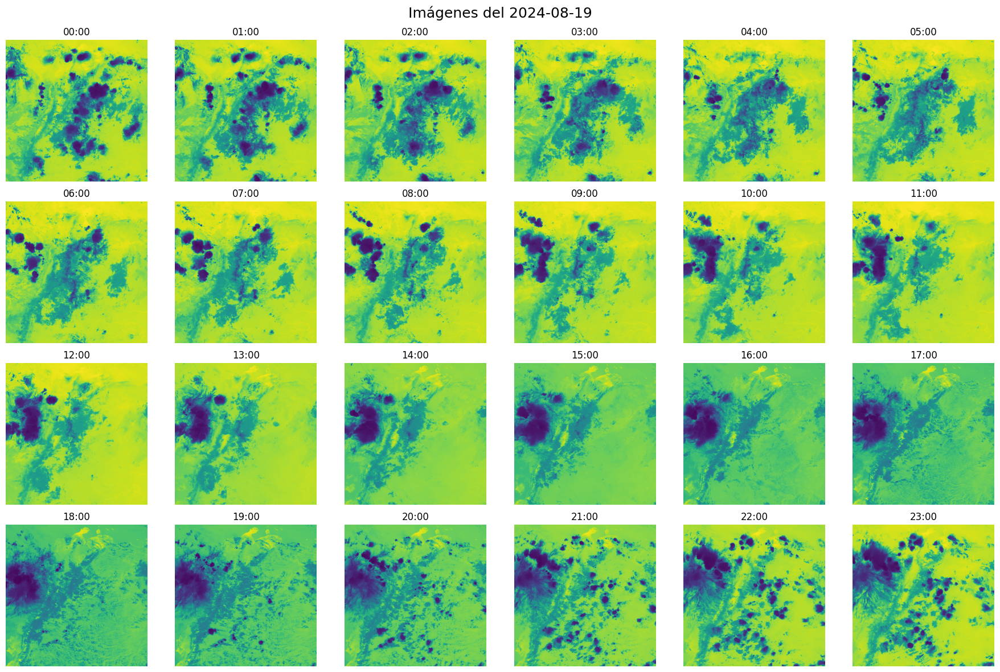

In [283]:
# Día que quieres visualizar (formato: 'YYYY-MM-DD')
dia_especifico = "2024-08-19"

# Filtrar el DataFrame por el día
df_dia = df_imagenes[df_imagenes.index.date == pd.to_datetime(dia_especifico).date()]

# Asegurar que estén ordenadas por hora
df_dia = df_dia.sort_index()

# Verificar si hay imágenes para ese día
if df_dia.empty:
    print(f"No se encontraron imágenes para el día {dia_especifico}")
else:
    # Crear figura
    fig, axes = plt.subplots(4, 6, figsize=(18, 12))
    axes = axes.flatten()

    for i, (fecha, fila) in enumerate(df_dia.iterrows()):
        if i >= 24:
            break  # Mostrar máximo 24 imágenes
        ruta_completa = os.path.join(ruta_archivos, fila["archivo"])
        radiancia = np.load(ruta_completa)

        ax = axes[i]
        im = ax.imshow(radiancia, cmap='viridis')
        ax.set_title(fecha.strftime('%H:%M'))
        ax.axis('off')

    # Ocultar ejes sobrantes si hay menos de 24
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(f'Imágenes del {dia_especifico}', fontsize=18)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

* Mínimo de radiancia

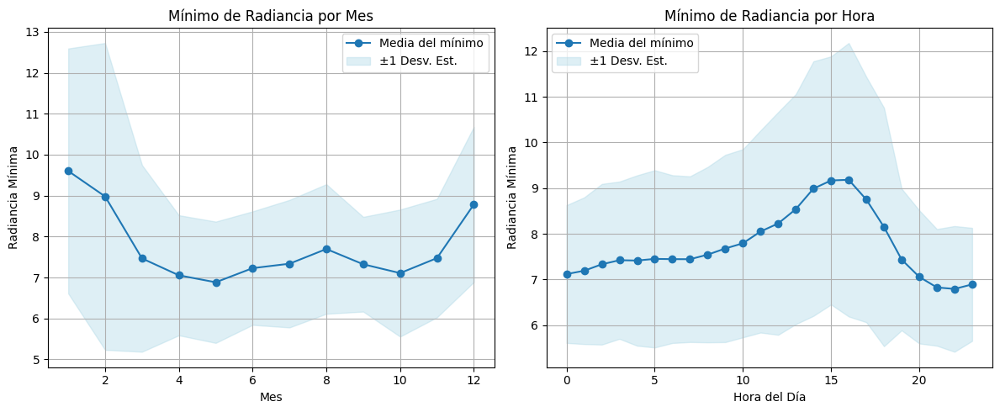

In [284]:
# ----- RESUMEN POR MES -----
resumen_min_mes = df_imagenes.groupby('mes')['minimo'].agg(['mean', 'std']).reset_index()
resumen_min_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_min_hora = df_imagenes.groupby('hora_num')['minimo'].agg(['mean', 'std']).reset_index()
resumen_min_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_min_mes['mes'], resumen_min_mes['media'], marker='o', label='Media del mínimo')
plt.fill_between(resumen_min_mes['mes'],
                 resumen_min_mes['media'] - resumen_min_mes['desviacion_estandar'],
                 resumen_min_mes['media'] + resumen_min_mes['desviacion_estandar'],
                 color='lightblue', alpha=0.4, label='±1 Desv. Est.')
plt.title('Mínimo de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Mínima')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_min_hora['hora_num'], resumen_min_hora['media'], marker='o', label='Media del mínimo')
plt.fill_between(resumen_min_hora['hora_num'],
                 resumen_min_hora['media'] - resumen_min_hora['desviacion_estandar'],
                 resumen_min_hora['media'] + resumen_min_hora['desviacion_estandar'],
                 color='lightblue', alpha=0.4, label='±1 Desv. Est.')
plt.title('Mínimo de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Mínima')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Máximo de radiancia

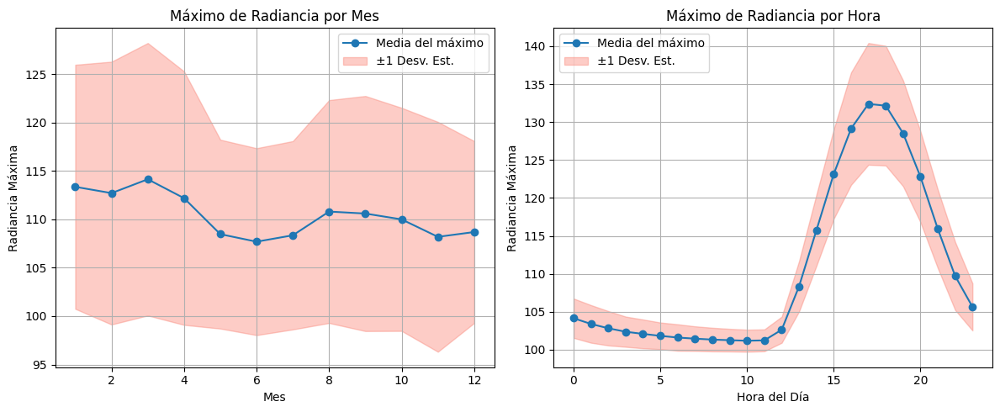

In [285]:
# ----- RESUMEN POR MES -----
resumen_max_mes = df_imagenes.groupby('mes')['maximo'].agg(['mean', 'std']).reset_index()
resumen_max_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_max_hora = df_imagenes.groupby('hora_num')['maximo'].agg(['mean', 'std']).reset_index()
resumen_max_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_max_mes['mes'], resumen_max_mes['media'], marker='o', label='Media del máximo')
plt.fill_between(resumen_max_mes['mes'],
                 resumen_max_mes['media'] - resumen_max_mes['desviacion_estandar'],
                 resumen_max_mes['media'] + resumen_max_mes['desviacion_estandar'],
                 color='salmon', alpha=0.4, label='±1 Desv. Est.')
plt.title('Máximo de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Máxima')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_max_hora['hora_num'], resumen_max_hora['media'], marker='o', label='Media del máximo')
plt.fill_between(resumen_max_hora['hora_num'],
                 resumen_max_hora['media'] - resumen_max_hora['desviacion_estandar'],
                 resumen_max_hora['media'] + resumen_max_hora['desviacion_estandar'],
                 color='salmon', alpha=0.4, label='±1 Desv. Est.')
plt.title('Máximo de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Máxima')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Promedio de radiancia

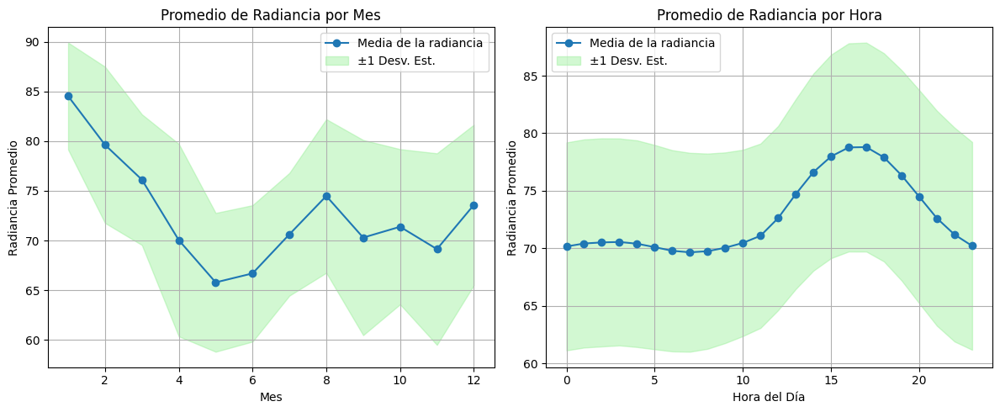

In [286]:
# ----- RESUMEN POR MES -----
resumen_media_mes = df_imagenes.groupby('mes')['media'].agg(['mean', 'std']).reset_index()
resumen_media_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_media_hora = df_imagenes.groupby('hora_num')['media'].agg(['mean', 'std']).reset_index()
resumen_media_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_media_mes['mes'], resumen_media_mes['media'], marker='o', label='Media de la radiancia')
plt.fill_between(resumen_media_mes['mes'],
                 resumen_media_mes['media'] - resumen_media_mes['desviacion_estandar'],
                 resumen_media_mes['media'] + resumen_media_mes['desviacion_estandar'],
                 color='lightgreen', alpha=0.4, label='±1 Desv. Est.')
plt.title('Promedio de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Promedio')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_media_hora['hora_num'], resumen_media_hora['media'], marker='o', label='Media de la radiancia')
plt.fill_between(resumen_media_hora['hora_num'],
                 resumen_media_hora['media'] - resumen_media_hora['desviacion_estandar'],
                 resumen_media_hora['media'] + resumen_media_hora['desviacion_estandar'],
                 color='lightgreen', alpha=0.4, label='±1 Desv. Est.')
plt.title('Promedio de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Promedio')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Mapa de calor

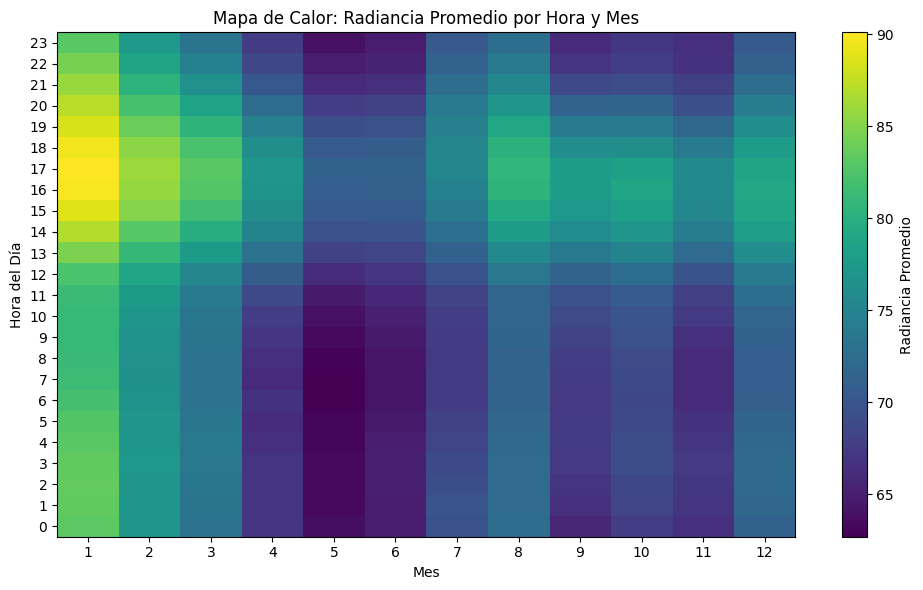

In [287]:
# Crear tabla pivote (hora vs mes)
pivot_heatmap = df_imagenes.pivot_table(
    values='media',
    index='hora_num',
    columns='mes',
    aggfunc='mean'
)

# Heatmap
plt.figure(figsize=(10, 6))
plt.imshow(pivot_heatmap, aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Radiancia Promedio')
plt.title('Mapa de Calor: Radiancia Promedio por Hora y Mes')
plt.xlabel('Mes')
plt.ylabel('Hora del Día')
plt.xticks(ticks=np.arange(0, 12), labels=[str(m) for m in range(1, 13)])
plt.yticks(ticks=np.arange(0, 24), labels=[str(h) for h in range(0, 24)])
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia promedio

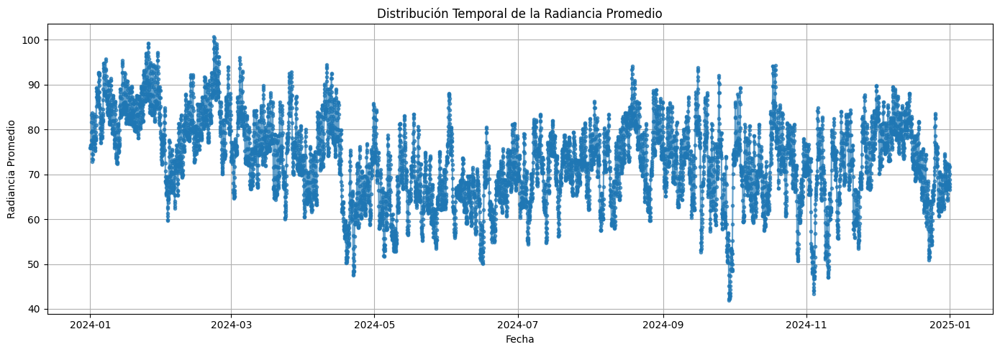

In [288]:
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['media'], marker='.', linestyle='-', alpha=0.7)
plt.title('Distribución Temporal de la Radiancia Promedio')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Promedio')
plt.grid(True)
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia mínima

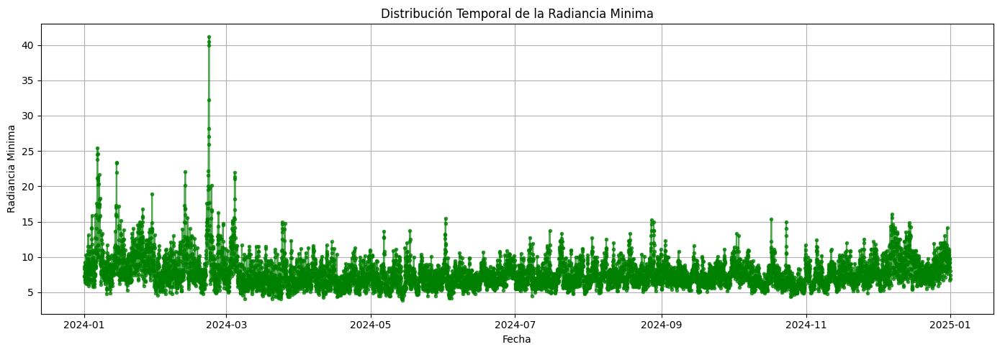

In [289]:
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['minimo'], marker='.', linestyle='-', alpha=0.7, color='green')
plt.title('Distribución Temporal de la Radiancia Minima')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Minima')
plt.grid(True)
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia máxima

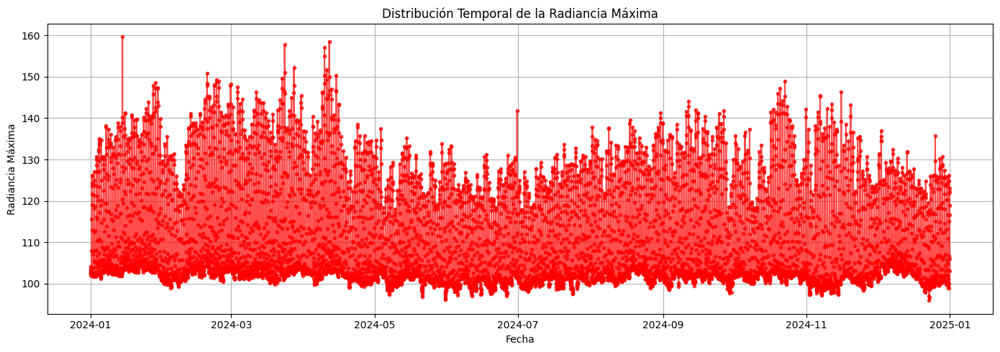

In [290]:
# Línea temporal de radiancia Máxima
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['maximo'], marker='.', linestyle='-', alpha=0.7, color='red')
plt.title('Distribución Temporal de la Radiancia Máxima')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Máxima')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4) Análisis de series de tiempo

Se realiza la descomposicion de la serie de tiempo empleando el modelo aditivo con un parametro period de 24 debido a la frecuencia de los datos. posteriormente se realizo el suavizado de la serie de tiempo mediante la tecnica del promedio movil simple.

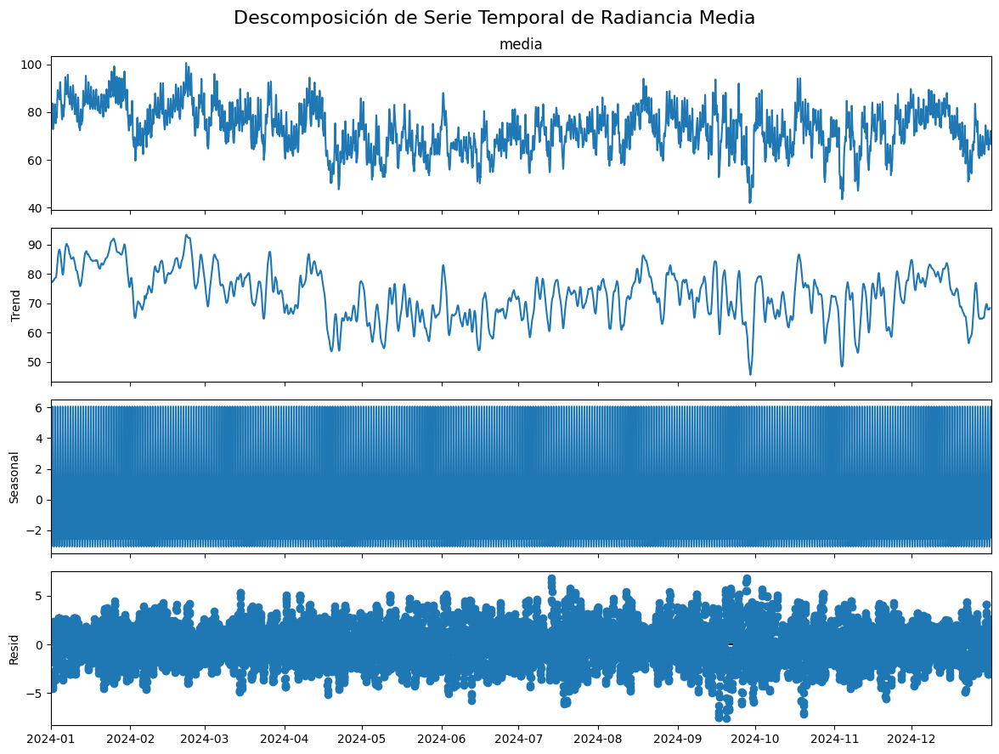

In [291]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Asegurar que la serie tenga frecuencia uniforme
# Resampleamos a una frecuencia horaria (puedes ajustar según tus datos)
serie_media = df_imagenes['media'].resample('h').mean()

# Rellenamos valores faltantes con interpolación (si hay huecos)
serie_media = serie_media.interpolate()

# Descomposición: modelo aditivo (puedes probar 'multiplicative' si tiene más sentido)
descomposicion = seasonal_decompose(serie_media, model='additive', period=24)  # 24 = diario si es por hora

# Graficar componentes
fig = descomposicion.plot()
fig.set_size_inches(12, 9)
fig.suptitle('Descomposición de Serie Temporal de Radiancia Media', fontsize=16)
plt.tight_layout()
plt.show()

* Promedio móvil simple

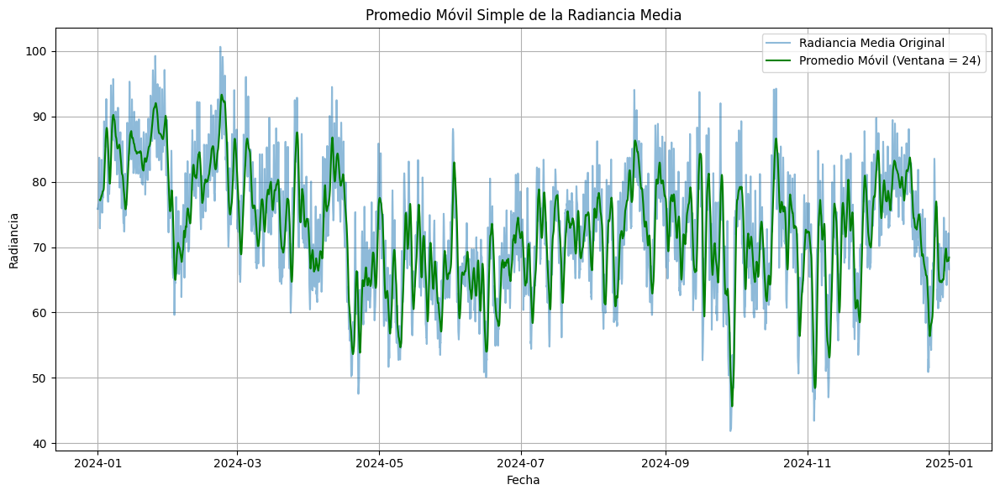

In [292]:
# 1. Resamplear la serie temporal a datos por hora
serie_media = df_imagenes['media'].resample('h').mean()

# 2. Rellenar valores faltantes si es necesario
serie_media = serie_media.interpolate()

# 3. Aplicar promedio móvil simple con una ventana de 24 (1 día si los datos son horarios)
ventana = 24
media_movil = serie_media.rolling(window=ventana).mean()

# 4. Graficar
plt.figure(figsize=(12, 6))
plt.plot(serie_media, label='Radiancia Media Original', alpha=0.5)
plt.plot(media_movil, label=f'Promedio Móvil (Ventana = {ventana})', color='green')
plt.title('Promedio Móvil Simple de la Radiancia Media')
plt.xlabel('Fecha')
plt.ylabel('Radiancia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 5) Valores atípicos

La detección de outliers se realizo a partir del rango intercuartilico y para el reemplazo de los outliers detectados se empleo la mediana.  

* Detección de outliers

In [294]:
# Función para detectar outliers en una matriz 2D desde archivo .npy
def detectar_outliers_archivo(ruta):
    matriz = np.load(ruta)
    flat = matriz.flatten()
    q1 = np.percentile(flat, 25)
    q3 = np.percentile(flat, 75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    outliers_mask = (flat < lower) | (flat > upper)
    num_outliers = np.sum(outliers_mask)
    return num_outliers, outliers_mask.reshape((920, 920))

# Aplica la función a cada archivo y guarda los resultados en nuevas columnas
df_imagenes[['num_outliers', 'outliers_mask']] = df_imagenes['archivo'].apply(
    lambda nombre: pd.Series(detectar_outliers_archivo(os.path.join(ruta_archivos, nombre)))
)

# Ejemplo: mostrar los primeros resultados
print(df_imagenes[['archivo', 'num_outliers']].head())

                                            archivo  num_outliers
fecha                                                            
2024-01-01 00:00:00  RadFC_20240101000020_Rad13.npy         30103
2024-01-01 01:00:00  RadFC_20240101010020_Rad13.npy         16313
2024-01-01 02:00:00  RadFC_20240101020020_Rad13.npy          5149
2024-01-01 03:00:00  RadFC_20240101030020_Rad13.npy          2803
2024-01-01 04:00:00  RadFC_20240101040020_Rad13.npy          4694


* Visualización de outliers

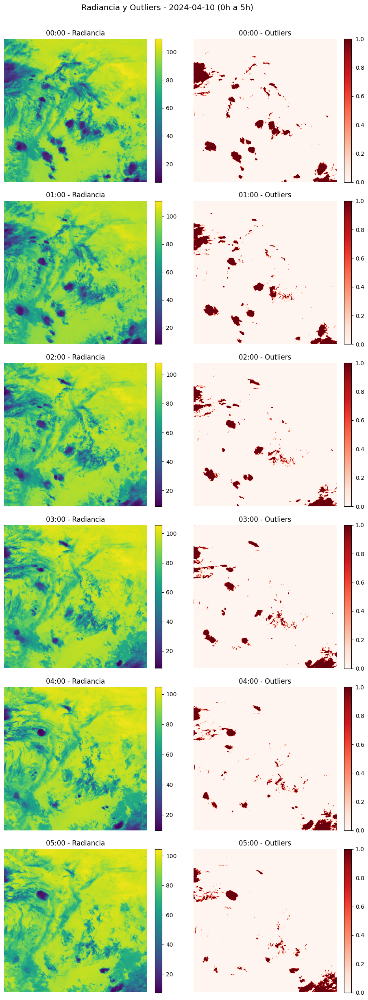

In [295]:
# Día a visualizar (puedes cambiar esta fecha)
fecha_objetivo = '2024-04-10'

# Filtrar las imágenes de ese día y entre las primeras 6 horas (0 a 5)
imagenes_dia = df_imagenes.loc[fecha_objetivo]
imagenes_6h = imagenes_dia[imagenes_dia.index.hour < 6].sort_index()

# Asegurar que hay imágenes disponibles
if imagenes_6h.empty:
    print(f"No se encontraron imágenes para las primeras 6 horas del {fecha_objetivo}")
else:
    n = len(imagenes_6h)
    plt.figure(figsize=(10, 4 * n))

    for i, (index, fila) in enumerate(imagenes_6h.iterrows()):
        ruta = os.path.join(ruta_archivos, fila['archivo'])
        radiancia = np.load(ruta)
        outliers_mask = fila['outliers_mask']

        # Radiancia
        plt.subplot(n, 2, 2 * i + 1)
        plt.imshow(radiancia, cmap='viridis')
        plt.title(f"{index.strftime('%H:%M')} - Radiancia")
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)

        # Outliers
        plt.subplot(n, 2, 2 * i + 2)
        plt.imshow(outliers_mask, cmap='Reds')
        plt.title(f"{index.strftime('%H:%M')} - Outliers")
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.suptitle(f"Radiancia y Outliers - {fecha_objetivo} (0h a 5h)", fontsize=14, y=1.02)
    plt.show()

* Reemplazar los outliers

In [297]:
import numpy as np
import os

# Función modificada para eliminar los outliers reemplazándolos con NaN o la mediana
def eliminar_outliers_archivo(ruta, reemplazo='nan'):  # reemplazo puede ser 'nan' o 'mediana'
    matriz = np.load(ruta)
    flat = matriz.flatten()

    # Cálculo de IQR y límites
    q1 = np.percentile(flat, 25)
    q3 = np.percentile(flat, 75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    # Máscara de outliers
    outliers_mask = (flat < lower) | (flat > upper)

    # Reemplazo de valores
    if reemplazo == 'nan':
        flat[outliers_mask] = np.nan
    elif reemplazo == 'mediana':
        mediana = np.median(flat[~outliers_mask])
        flat[outliers_mask] = mediana

    # Reshape a matriz original
    matriz_sin_outliers = flat.reshape((920, 920))
    return matriz_sin_outliers

In [298]:
# Crear carpeta para guardar archivos sin outliers
carpeta_salida = "./rad13_sin_outliers"
os.makedirs(carpeta_salida, exist_ok=True)

# Procesar y guardar los archivos sin outliers
for archivo in df_imagenes['archivo']:
    ruta_original = os.path.join(ruta_archivos, archivo)
    matriz_limpia = eliminar_outliers_archivo(ruta_original, reemplazo='mediana')  # o 'nan'
    ruta_salida = os.path.join(carpeta_salida, archivo)
    np.save(ruta_salida, matriz_limpia)

In [299]:
# Ruta donde están almacenados los archivos .npy
ruta_archivos = "./rad13_sin_outliers"
archivos = os.listdir(ruta_archivos)

# Función para procesar un archivo individual (sin guardar la matriz radiancia)
def procesar_archivo(archivo):
    if archivo.endswith(".npy") and archivo.startswith("RadFC_"):
        try:
            nombre = archivo.replace("RadFC_", "").replace("_Rad13.npy", "")
            fecha_str = nombre[:12]  # 'YYYYMMDDHHMM'
            fecha_datetime = datetime.strptime(fecha_str, "%Y%m%d%H%M")
            fecha = fecha_datetime
            mes = fecha_datetime.month
            hora = fecha_datetime.strftime("%H:%M")
            hora_num = fecha_datetime.hour
            ruta_completa = os.path.join(ruta_archivos, archivo)
            radiancia = np.load(ruta_completa).astype(np.float32)
            if radiancia.shape == (920, 920):
                return {
                    "fecha": fecha,
                    "mes": mes,
                    "hora": hora,
                    "hora_num": hora_num,
                    "archivo": archivo,
                    "media": np.mean(radiancia),
                    "varianza": np.var(radiancia),
                    "desviacion_estandar": np.std(radiancia),
                    "minimo": np.min(radiancia),
                    "maximo": np.max(radiancia),
                    "mediana": np.median(radiancia),
                }
            else:
                print(f"Dimensiones incorrectas en: {archivo}")
        except Exception as e:
            print(f"Error procesando {archivo}: {e}")
    return None

# Procesar todos los archivos y guardar los resultados válidos
datos = []
for archivo in archivos:
    resultado = procesar_archivo(archivo)
    if resultado is not None:
        datos.append(resultado)

# Crear el DataFrame y establecer 'fecha' como índice
df_imag_so = pd.DataFrame(datos)
df_imag_so["fecha"] = pd.to_datetime(df_imag_so["fecha"])
df_imag_so = df_imag_so.set_index("fecha")
df_imag_so.sort_index(inplace=True)
# Guardar el DataFrame en un archivo CSV
df_imag_so.to_csv("df_imag_so.csv")

# Mostrar las primeras filas para verificar
print(df_imag_so.head())

                     mes   hora  hora_num                         archivo  \
fecha                                                                       
2024-01-01 00:00:00    1  00:00         0  RadFC_20240101000020_Rad13.npy   
2024-01-01 01:00:00    1  01:00         1  RadFC_20240101010020_Rad13.npy   
2024-01-01 02:00:00    1  02:00         2  RadFC_20240101020020_Rad13.npy   
2024-01-01 03:00:00    1  03:00         3  RadFC_20240101030020_Rad13.npy   
2024-01-01 04:00:00    1  04:00         4  RadFC_20240101040020_Rad13.npy   

                         media    varianza  desviacion_estandar     minimo  \
fecha                                                                        
2024-01-01 00:00:00  78.386208  481.097656            21.933939  19.436731   
2024-01-01 01:00:00  77.299774  488.951080            22.112238  18.705069   
2024-01-01 02:00:00  76.273544  483.943481            21.998716  15.961332   
2024-01-01 03:00:00  76.179817  447.778625            21.160780  14.68

* Visualización de imágenes

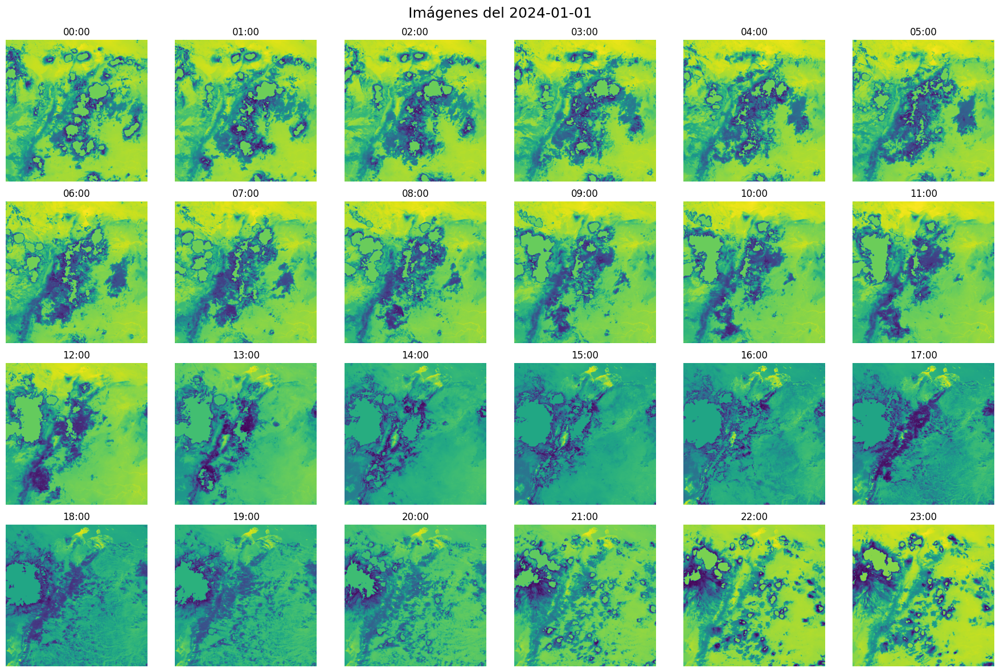

In [300]:
# Día que quieres visualizar (formato: 'YYYY-MM-DD')
dia_especifico_so = "2024-01-01"

# Filtrar el DataFrame por el día
df_dia_so = df_imag_so[df_imag_so.index.date == pd.to_datetime(dia_especifico_so).date()]

# Asegurar que estén ordenadas por hora
df_dia_so = df_dia_so.sort_index()

# Verificar si hay imágenes para ese día
if df_dia_so.empty:
    print(f"No se encontraron imágenes para el día {dia_especifico_so}")
else:
    # Crear figura
    fig, axes = plt.subplots(4, 6, figsize=(18, 12))
    axes = axes.flatten()

    for i, (fecha, fila) in enumerate(df_dia.iterrows()):
        if i >= 24:
            break  # Mostrar máximo 24 imágenes
        ruta_completa = os.path.join(ruta_archivos, fila["archivo"])
        radiancia = np.load(ruta_completa)

        ax = axes[i]
        im = ax.imshow(radiancia, cmap='viridis')
        ax.set_title(fecha.strftime('%H:%M'))
        ax.axis('off')

    # Ocultar ejes sobrantes si hay menos de 24
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(f'Imágenes del {dia_especifico_so}', fontsize=18)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

* Serie de tiempo después de eliminación de outliers

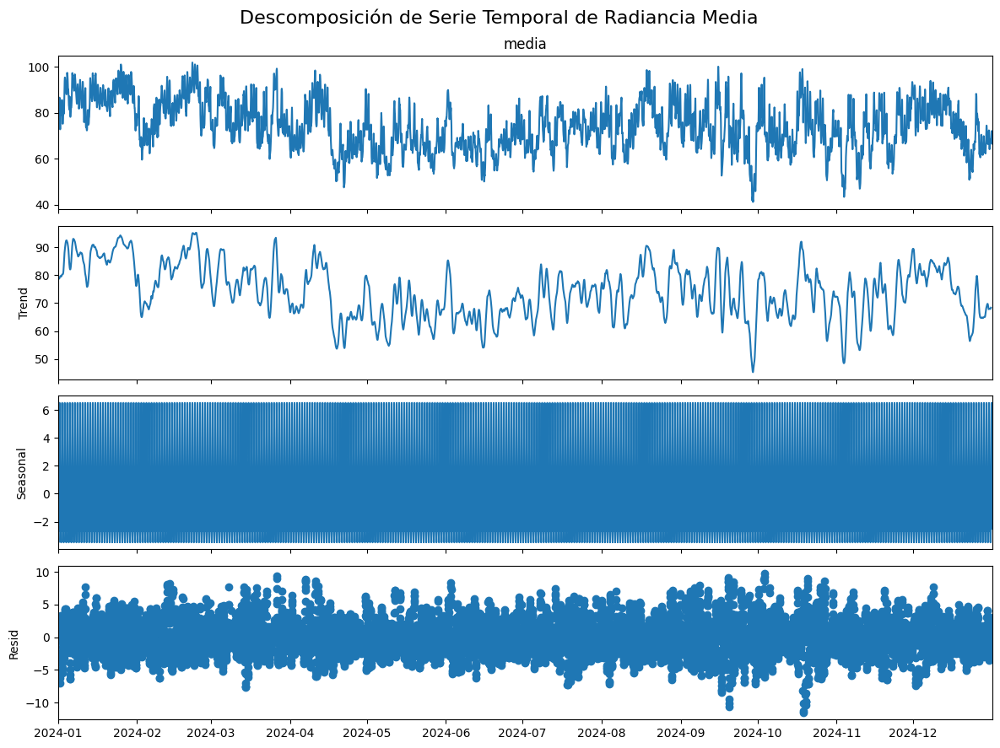

In [301]:
# Asegurar que la serie tenga frecuencia uniforme
# Resampleamos a una frecuencia horaria (puedes ajustar según tus datos)
serie_media_so = df_imag_so['media'].resample('h').mean()

# Rellenamos valores faltantes con interpolación (si hay huecos)
serie_media_so = serie_media_so.interpolate()

# Descomposición: modelo aditivo (puedes probar 'multiplicative' si tiene más sentido)
descomposicion_so = seasonal_decompose(serie_media_so, model='additive', period=24)  # 24 = diario si es por hora

# Graficar componentes
fig = descomposicion_so.plot()
fig.set_size_inches(12, 9)
fig.suptitle('Descomposición de Serie Temporal de Radiancia Media', fontsize=16)
plt.tight_layout()
plt.show()

* Promedio movil simple

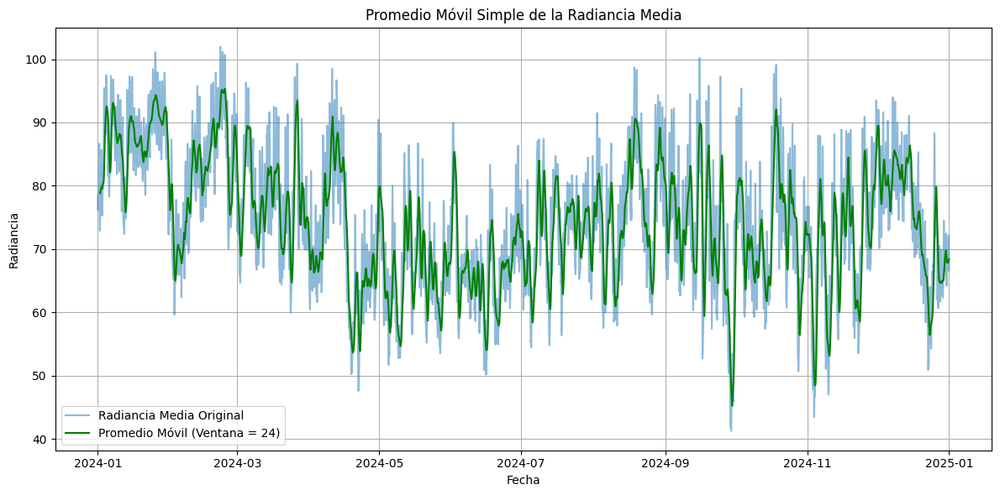

In [302]:
#Aplicar promedio móvil simple con una ventana de 24 (1 día si los datos son horarios)
ventana = 24
media_movil_so = serie_media_so.rolling(window=ventana).mean()

#Graficar
plt.figure(figsize=(12, 6))
plt.plot(serie_media_so, label='Radiancia Media Original', alpha=0.5)
plt.plot(media_movil_so, label=f'Promedio Móvil (Ventana = {ventana})', color='green')
plt.title('Promedio Móvil Simple de la Radiancia Media')
plt.xlabel('Fecha')
plt.ylabel('Radiancia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 6) Trasformación de los datos

Como parte de la preparación del dataset para su aplicacion en modelos de machine learning se realiza el escalado de los valores de radiancia de cada una de las imagenes.

In [303]:
# Ruta donde están almacenados los archivos .npy
ruta_archivos = "./rad13"  # Cambia esto por la ruta real
archivos = os.listdir(ruta_archivos)

# Función para escalar los datos entre 0 y 1
def escalar_min_max(matriz):
    min_val = np.min(matriz)
    max_val = np.max(matriz)
    if max_val > min_val:
        return (matriz - min_val) / (max_val - min_val)
    else:
        return np.zeros_like(matriz)  # Si todos los valores son iguales

# Función para procesar un archivo individual y escalar la matriz
def procesar_archivo(archivo):
    if archivo.endswith(".npy") and archivo.startswith("RadFC_"):
        try:
            nombre = archivo.replace("RadFC_", "").replace("_Rad13.npy", "")
            fecha_str = nombre[:12]  # 'YYYYMMDDHHMM'
            fecha_datetime = datetime.strptime(fecha_str, "%Y%m%d%H%M")
            fecha = fecha_datetime
            mes = fecha_datetime.month
            hora = fecha_datetime.strftime("%H:%M")
            hora_num = fecha_datetime.hour
            ruta_completa = os.path.join(ruta_archivos, archivo)
            radiancia = np.load(ruta_completa).astype(np.float32)

            if radiancia.shape == (920, 920):
                # Escalado entre 0 y 1
                radiancia_escalada = escalar_min_max(radiancia)

                # Puedes guardar la matriz escalada si lo deseas:
                # np.save(os.path.join("./rad13_escalado", archivo), radiancia_escalada)

                return {
                    "fecha": fecha,
                    "mes": mes,
                    "hora": hora,
                    "hora_num": hora_num,
                    "archivo": archivo,
                    "media": np.mean(radiancia_escalada),
                    "varianza": np.var(radiancia_escalada),
                    "desviacion_estandar": np.std(radiancia_escalada),

                    "mediana": np.median(radiancia_escalada),
                }
            else:
                print(f"Dimensiones incorrectas en: {archivo}")
        except Exception as e:
            print(f"Error procesando {archivo}: {e}")
    return None

# Procesar todos los archivos y guardar los resultados válidos
datos = []
for archivo in archivos:
    resultado = procesar_archivo(archivo)
    if resultado is not None:
        datos.append(resultado)

# Crear el DataFrame y establecer 'fecha' como índice
df_imagenes = pd.DataFrame(datos)
df_imagenes["fecha"] = pd.to_datetime(df_imagenes["fecha"])
df_imagenes = df_imagenes.set_index("fecha")
df_imagenes.sort_index(inplace=True)

# Mostrar las primeras filas para verificar
print(df_imagenes.head())

                     mes   hora  hora_num                         archivo  \
fecha                                                                       
2024-01-01 00:00:00    1  00:00         0  RadFC_20240101000020_Rad13.npy   
2024-01-01 01:00:00    1  01:00         1  RadFC_20240101010020_Rad13.npy   
2024-01-01 02:00:00    1  02:00         2  RadFC_20240101020020_Rad13.npy   
2024-01-01 03:00:00    1  03:00         3  RadFC_20240101030020_Rad13.npy   
2024-01-01 04:00:00    1  04:00         4  RadFC_20240101040020_Rad13.npy   

                        media  varianza  desviacion_estandar   mediana  
fecha                                                                   
2024-01-01 00:00:00  0.707336  0.065306             0.255551  0.813767  
2024-01-01 01:00:00  0.710870  0.062510             0.250020  0.808120  
2024-01-01 02:00:00  0.715029  0.056910             0.238559  0.798547  
2024-01-01 03:00:00  0.710928  0.049458             0.222392  0.783515  
2024-01-01 04:00:00  0

* Línea temporal de la radiancia promedio después de la transformación

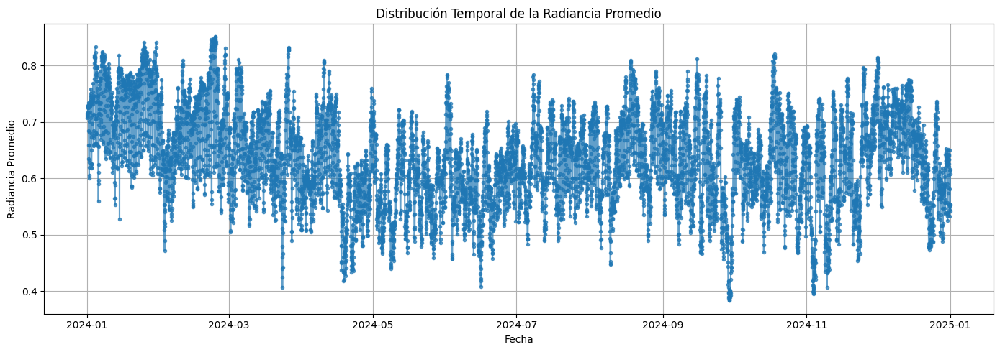

In [304]:
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['media'], marker='.', linestyle='-', alpha=0.7)
plt.title('Distribución Temporal de la Radiancia Promedio')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Promedio')
plt.grid(True)
plt.tight_layout()
plt.show()

# Conclusiones

* El uso de archivos .npy y la construcción de un DataFrame con estadísticas clave (media, varianza, mínimo, máximo, mediana) permitió analizar grandes cantidades de imágenes satelitales de manera eficiente, evitando la sobrecarga de memoria.

* El análisis exploratorio mostró que la radiancia presenta variaciones significativas tanto a lo largo de los meses como de las horas del día, lo que evidencia la influencia de factores estacionales y horarios en la cobertura nubosa y la radiación solar.

* La detección de outliers mediante el rango intercuartílico y su reemplazo por la mediana mejoró la calidad de los datos, permitiendo obtener series temporales más limpias y representativas para el análisis y modelado.

* La descomposición aditiva y el uso del promedio móvil simple permitieron identificar tendencias, estacionalidades y fluctuaciones en la radiancia, facilitando la comprensión de los patrones temporales y la preparación de los datos para modelos predictivos.

* El escalado de las imágenes entre 0 y 1 y la organización de los datos en series temporales proporcionan una base sólida para la aplicación de modelos de aprendizaje automático orientados a la predicción del movimiento de nubes y la optimización de plantas fotovoltaicas.